In [1]:
!pip install cmake dlib face_recognition numpy opencv-python

     |████████████████████████████████| 100.2MB 31kB/s 
  Created wheel for face-recognition-models: filename=face_recognition_models-0.3.0-py2.py3-none-any.whl size=100566173 sha256=0f34f351773dad37c116a43668e74130e9bab2ce184092ad3f4c0a08a9305b4c
  Stored in directory: /root/.cache/pip/wheels/d2/99/18/59c6c8f01e39810415c0e63f5bede7d83dfb0ffc039865465f
Successfully built face-recognition-models


In [2]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [3]:
%cd /gdrive/My Drive/FaceDetection

/gdrive/My Drive/FaceDetection


In [4]:
ls

faces/  test1.jpg  test2.jpg  test3.jpg  test4.jpg


In [5]:
import face_recognition as fr
import cv2
import os, shutil
import numpy as np
from google.colab.patches import cv2_imshow

In [6]:
def get_encoded_faces():
  encoded= {}
  for dirpath,dirname,fname in os.walk('./faces'):
    for f in fname:
      if f.endswith("jpg") or f.ends("png"):
        face= fr.load_image_file("faces/"+f)
        encoding= fr.face_encodings(face)[0]
        encoded[f.split(".")[0]]= encoding
  return encoded


In [7]:
x=get_encoded_faces()

In [18]:
x

{'ArianaGrande': array([-3.98659818e-02,  6.81177452e-02,  5.30251898e-02, -4.95009907e-02,
        -1.30312979e-01,  3.49977538e-02, -1.50204390e-01, -9.11461264e-02,
         2.04633221e-01, -1.28879443e-01,  1.59677416e-01, -6.15282655e-02,
        -2.70368278e-01,  5.05809858e-02, -2.00239062e-01,  2.04498649e-01,
        -8.09055567e-02, -2.19064623e-01,  1.21167880e-02, -2.68940609e-02,
         4.35684957e-02,  1.90634448e-02, -1.67403072e-02,  8.09765980e-02,
        -1.15898669e-01, -3.17917168e-01, -2.40947530e-02, -1.49494484e-02,
        -5.30903339e-02, -1.51136145e-01,  9.59854573e-04,  1.76485434e-01,
        -1.77314907e-01,  7.88980126e-02, -1.82567406e-02,  1.47792548e-01,
        -2.07063984e-02, -1.41083837e-01,  1.27921790e-01,  6.68004304e-02,
        -2.92757541e-01, -4.75791246e-02,  1.20040663e-02,  2.95131445e-01,
         1.42778218e-01, -7.41616562e-02,  7.21922591e-02, -1.38524532e-01,
         1.41058750e-02, -2.42744148e-01,  2.51328424e-02,  2.52857774e-

In [14]:
def classify_face(im):
  faces=get_encoded_faces()
  faces_encoded=list(faces.values())
  known_face_names=list(faces.keys())

  img=cv2.imread(im)
  face_locations= fr.face_locations(img)
  unknown_face_encodings= fr.face_encodings(img,face_locations)

  face_names=[]
  for face_encoding in unknown_face_encodings:
    name="Unknown"
    matches=fr.compare_faces(faces_encoded,face_encoding)

    face_distances= fr.face_distance(faces_encoded,face_encoding)
    best_match_index=np.argmin(face_distances)
    if matches[best_match_index]:
      name= known_face_names[best_match_index]

    face_names.append(name)

    for(top,right,bottom,left),name in zip(face_locations,face_names):
      cv2.rectangle(img,(left-20,top-20),(right+20,bottom+20),(255,0,0),2)
      cv2.rectangle(img,(left-20,bottom-15),(right+20,bottom+20),(255,0,0),cv2.FILLED)
      cv2.putText(img,name,(left-20,bottom+15),cv2.FONT_HERSHEY_DUPLEX,0.5,(255,255,255),1)
  while True:
    cv2_imshow(img)
    return face_names

    




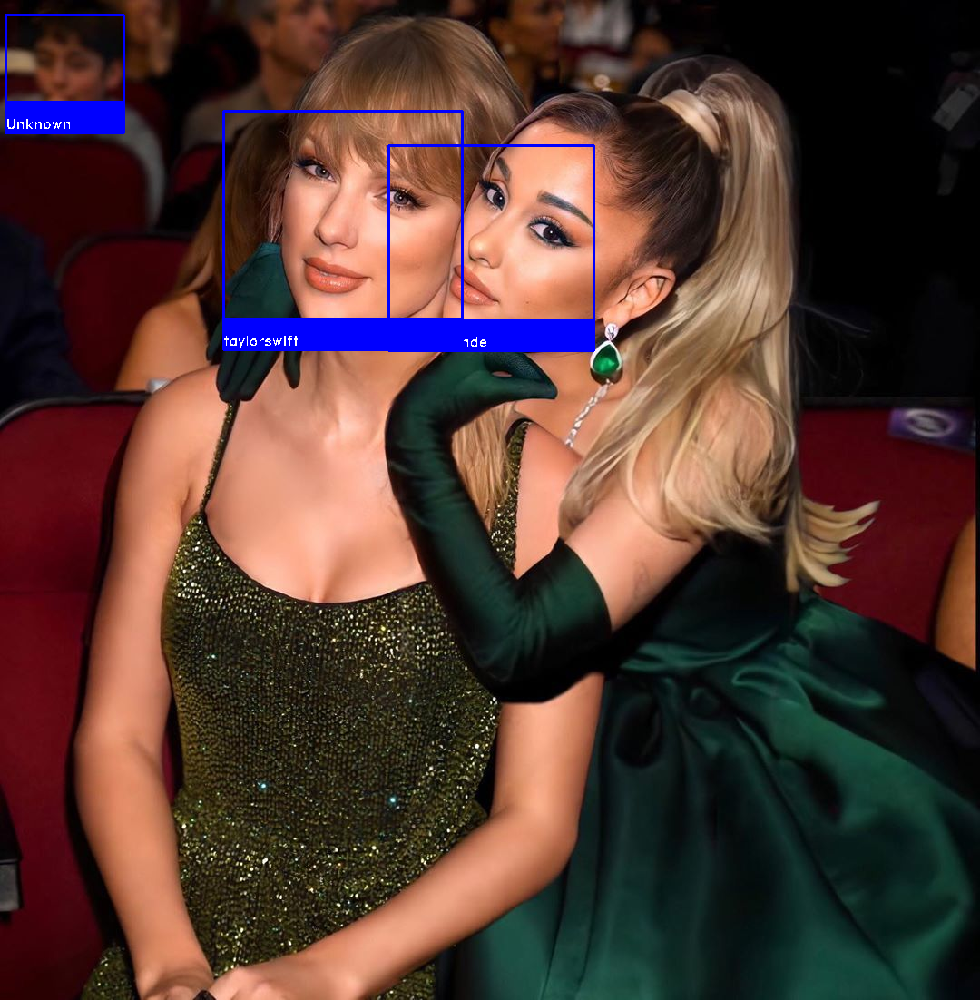

['ArianaGrande', 'taylorswift', 'Unknown']

In [15]:
classify_face("test1.jpg")

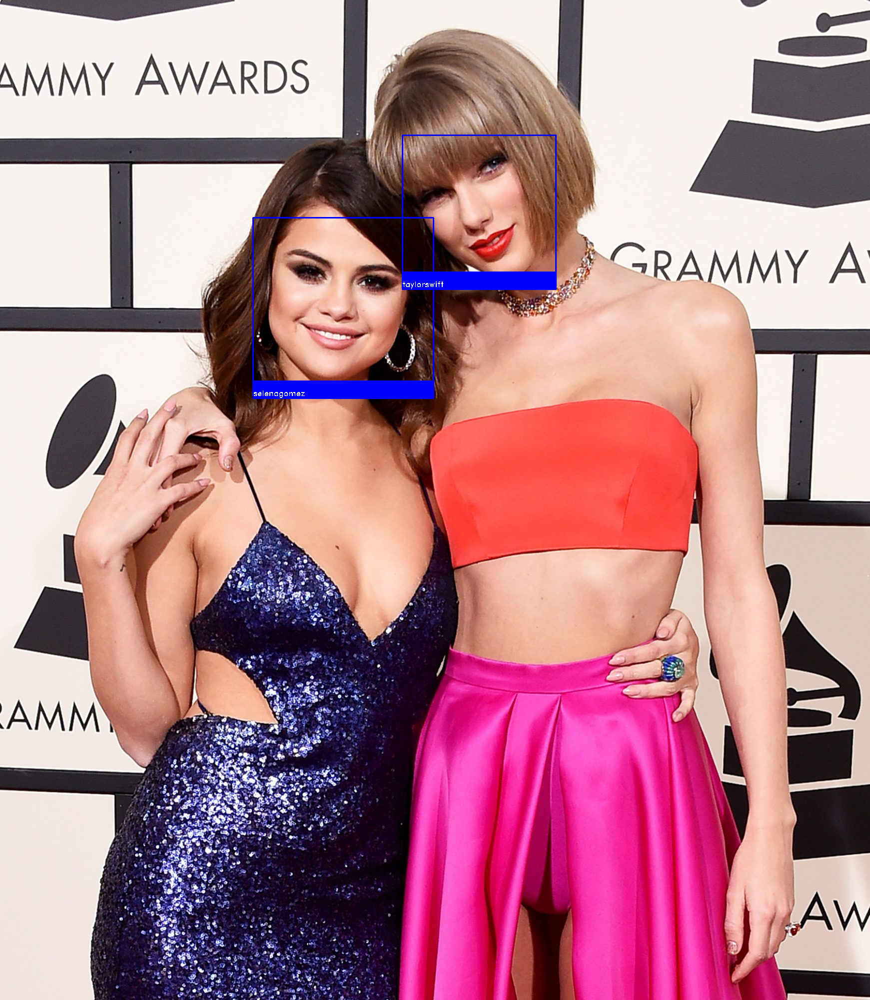

['selenagomez', 'taylorswift']

In [16]:
classify_face("test2.jpg")

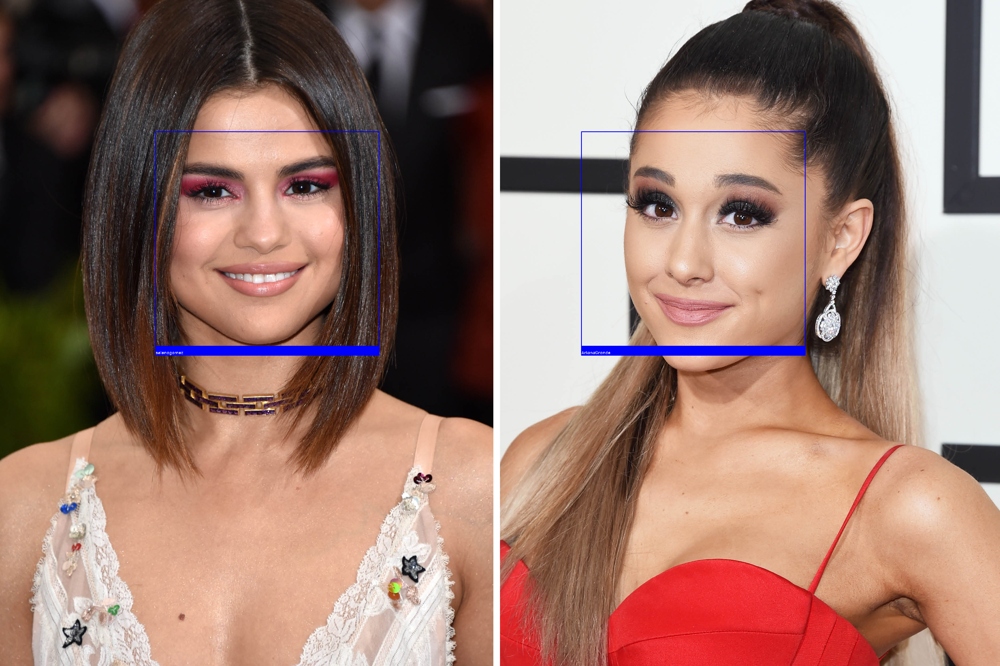

['selenagomez', 'ArianaGrande']

In [17]:
classify_face("test3.jpg")